In [756]:
%reset

Once deleted, variables cannot be recovered. Proceed (y/[n])? y


In [47]:
from __future__ import print_function
from __future__ import division
from sklearn import cross_validation
import tensorflow as tf
import networkx as nx
import json
import numpy as np
import seaborn as sns
import itertools
from nltk import FreqDist
from scipy.stats import gaussian_kde
from sklearn import svm,preprocessing,metrics,model_selection
from keras.models import Sequential
from keras.layers import Dense, Activation
from keras.layers.core import Dense, Dropout, Activation
from keras import optimizers,initializers
from sklearn.preprocessing import LabelBinarizer
import pandas as pd
from matplotlib import pyplot as plt
from keras.optimizers import RMSprop
from keras.utils import np_utils
from mpl_toolkits.mplot3d import Axes3D
from scipy import stats
sns.set(rc={'axes.facecolor':'white'})
pd.set_option('display.max_rows', 1000)

%matplotlib inline

In [3]:
df = pd.DataFrame.from_csv('../Segment2_SignEpi.csv', sep=',')
df['Substitution'] = df.VarPos.map(lambda x: str(x-1)) + df.Perm.map(lambda x: x)
combinations = list(set(df.VarPos.map(lambda x: str(x-1)) + df.Perm.map(lambda x: x)))

In [166]:
df

,Seq2,Fit1,Fit2,VarPos,Perm,FitImpact,FitImpactThreshGood2,FitImpactThreshBad2,Substitution
Seq1,,,,,,,,,
DAFAFIDCIPF,GAFAFIDCIPF,0.468477,0.439018,1,DG,0.029459,0,0,0DG
DAFAFIDCIPI,GAFAFIDCIPI,0.390043,0.428813,1,DG,-0.038770,0,0,0DG
DAFAFIDCIPL,GAFAFIDCIPL,0.410101,0.435770,1,DG,-0.025668,0,0,0DG
DAFAFIDCIPV,GAFAFIDCIPV,0.292656,0.451414,1,DG,-0.158758,0,0,0DG
DAFAFIDCITI,GAFAFIDCITI,0.291721,0.026741,1,DG,0.264980,1,0,0DG
DAFAFIDCITV,GAFAFIDCITV,0.368944,0.452558,1,DG,-0.083613,0,0,0DG
DAFAFIDCVPF,GAFAFIDCVPF,0.415926,0.420454,1,DG,-0.004528,0,0,0DG
DAFAFIDCVPI,GAFAFIDCVPI,0.364853,0.433236,1,DG,-0.068383,0,0,0DG
DAFAFIDCVPL,GAFAFIDCVPL,0.424388,0.414736,1,DG,0.009652,0,0,0DG


***

#### 1. Functions

In [4]:
def extractData(pairNumber):
    mutationDF = df[df.Substitution == combinations[pairNumber]]
    mutationDF['effect'] = mutationDF.FitImpactThreshBad2 + mutationDF.FitImpactThreshGood2
    mutationDF = mutationDF[mutationDF.effect >= 1]

    for i in range(len(mutationDF.Seq2[0])):
        mutationDF[str(i)] = mutationDF.Seq2.str[i]
        
    mutList = []
    
    for seq in mutationDF.index:
        mutList.extend([str(x)+seq[x] for x in range(len(seq))])
    
    for seq in mutationDF.Seq2:
        mutList.extend([str(x)+seq[x] for x in range(len(seq))])

    mutList = sorted(list(set(mutList)))
    
    indexList = []

    for i in range(len(mutationDF.Seq2)):
        seq = mutationDF.Seq2[i]
        indexList.append(set([mutList.index(str(x)+seq[x]) for x in range(len(seq))]))
        
    data = np.zeros((len(mutationDF.Seq2),len(mutList)))

    for i in range(len(indexList)):
        line = np.zeros((1,len(mutList)))
        line[:,list(indexList[i])] = 1.

        data[i] = line
        
    labels = mutationDF.FitImpact.values.copy()
    
    if len(labels[labels>0.2]) > len(labels[labels<-0.2]):
        labels[labels>0.2] = 0
        labels[labels<-0.2] = 1
    else:
        labels[labels>0.2] = 1
        labels[labels<-0.2] = 0        
    
    classWeights = {}
    fd = FreqDist(labels)

    for key in fd:
        classWeights[key] = sum(fd.values())/fd[key]
        
    print ("%d  Minor-mutations, %d Major-mutations" % (sum(labels), len(labels) - sum(labels)))
    print ("The fraction of Minor-mutations constitutes %.2f%%" % (100*sum(labels)/len(labels)))
    
    print ('\nThe class weights are:', classWeights)
    
    return data, labels, classWeights, mutList, mutationDF

In [5]:
def trainNN(data, labels, class_weights, n_iter):
    
    model = Sequential()

    init = initializers.Orthogonal(gain=1.0, seed=None)

    model.add(Dense(1, input_dim=data.shape[1], activation='sigmoid', kernel_initializer=init))
    model.add(Dense(100, activation='sigmoid', kernel_initializer=init))
    model.add(Dense(100, activation='sigmoid', kernel_initializer=init))
    model.add(Dense(100, activation='sigmoid', kernel_initializer=init))
    model.add(Dense(100, activation='sigmoid', kernel_initializer=init))
    model.add(Dense(1, activation='sigmoid', kernel_initializer=init))

    # opt = optimizers.RMSprop(lr=0.001, rho=0.9, epsilon=1e-08, decay=0.0)

    model.compile(optimizer='adam',
                  loss='binary_crossentropy',
                  verbose=0,
                  metrics=['accuracy'])

    hist = model.fit(data, labels, epochs=n_iter, batch_size=400, shuffle=True, verbose=0, class_weight=class_weights)

    weights = model.layers[0].get_weights()[0]
    biases = model.layers[0].get_weights()[1]

    proba = model.predict_proba(data, batch_size=100, verbose=0)
    predicted = model.predict_classes(data, batch_size=100, verbose=0)
    
    print ("The fraction of Minor-mutations in prediction constitutes %.2f%%" % (100*sum(predicted)/len(predicted)))
    
    counterMinus = 0
    counterPlus = 0

    for i in range(len(labels)):
        if labels[i] == predicted[i] == 0:
            counterMinus+=1
        if labels[i] == predicted[i] == 1:
            counterPlus+=1

    print("%d Minor-mutations were predicted correctly" % counterPlus)
    print("%d Major-mutations were predicted correctly" % counterMinus)

    print ("\nThe accuracy of this prediction is %.2f" % hist.history['acc'][-1])
    
    return weights, predicted, proba, hist.history['loss'], hist.history['acc'][-1]

***

#### 2. Predicting

In [6]:
data, labels, classWeights, mutList, mutationDF = extractData(15)

212  Minor-mutations, 428 Major-mutations
The fraction of Minor-mutations constitutes 33.12%

The class weights are: {0.0: 1.4953271028037383, 1.0: 3.018867924528302}


/home/katya/anaconda3/envs/python2/lib/python2.7/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


In [892]:
weights, predicted, proba, loss, acc = trainNN(data, labels, classWeights, 500)

The fraction of '+'-effects in prediction constitutes 55.94%
182 Minor-mutations were predicted correctly
252 Major-mutations were predicted correctly

The accuracy of this prediction is 0.69


***

#### 3. Ananlysis

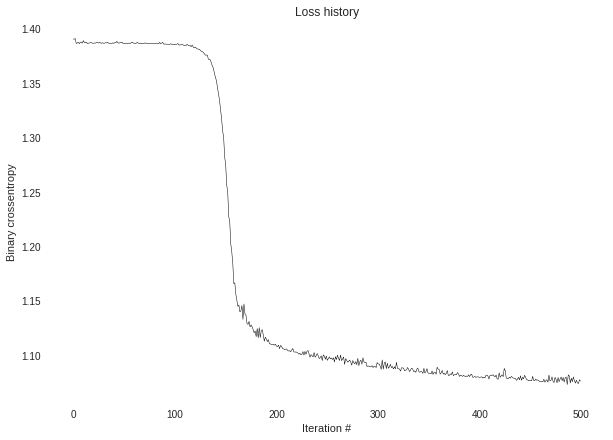

In [893]:
plt.figure(figsize=[10,7])
plt.title('Loss history')
plt.xlabel('Iteration #')
plt.ylabel('Binary crossentropy')
plt.plot(range(len(loss)), loss, 'k', lw=0.5);

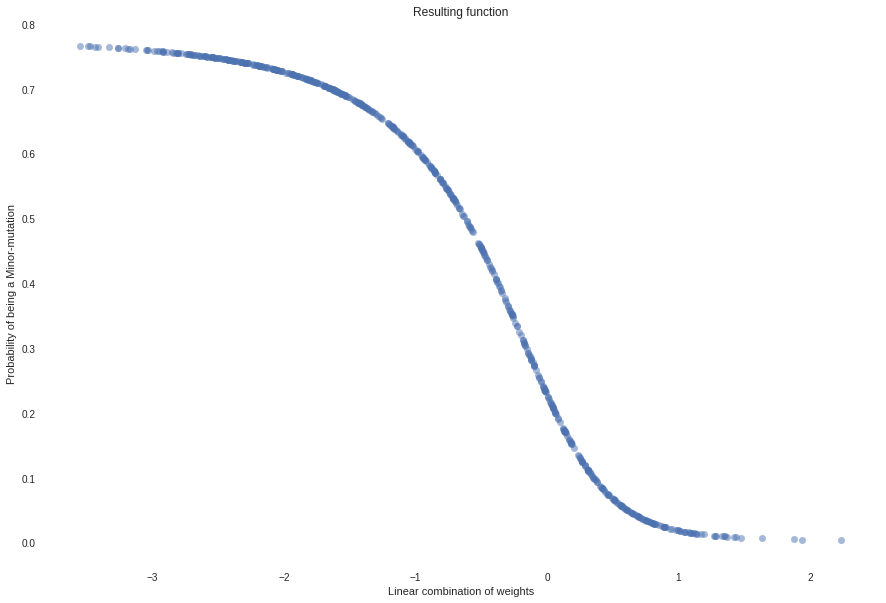

In [900]:
plt.figure(figsize=[15,10])
plt.title('Resulting function')
plt.xlabel('Linear combination of weights')
plt.ylabel('Probability of being a Minor-mutation')
plt.plot(data.dot(weights), proba, 'o', alpha=0.5);

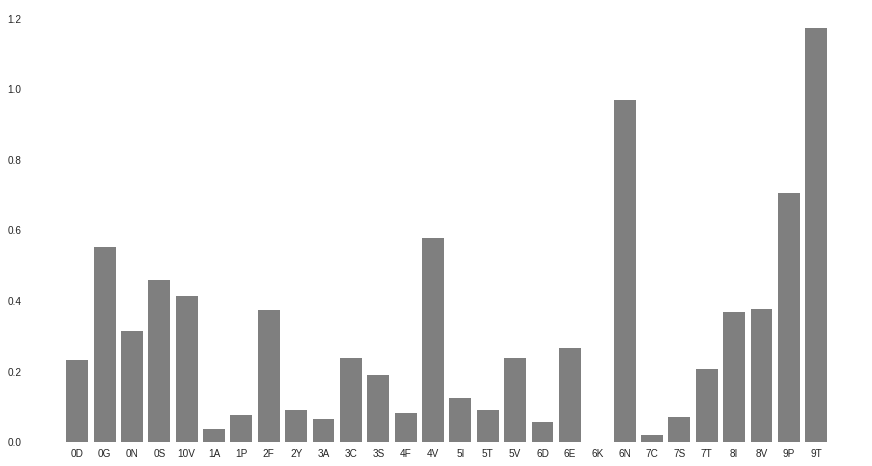

In [895]:
fig, ax = plt.subplots(figsize=[15,8])

plt.bar(range(len(weights)), [np.abs(x) for x in weights.flatten()], alpha=0.5, color='k')
plt.xticks(range(len(weights)))
ax.set_xticklabels(mutList);

In [896]:
for i in range(len(weights)):
    print (mutList[i], '\t', np.abs(weights[i][0]))

0D 	 0.231117
0G 	 0.551439
0N 	 0.313839
0S 	 0.457504
10V 	 0.413316
1A 	 0.0367107
1P 	 0.0751765
2F 	 0.37468
2Y 	 0.0912599
3A 	 0.0632942
3C 	 0.23811
3S 	 0.188034
4F 	 0.0809484
4V 	 0.577463
5I 	 0.124631
5T 	 0.0907313
5V 	 0.23649
6D 	 0.0562001
6E 	 0.264493
6K 	 0.000737418
6N 	 0.967696
7C 	 0.0198344
7S 	 0.0715958
7T 	 0.206968
8I 	 0.3671
8V 	 0.376356
9P 	 0.704984
9T 	 1.17386


In [897]:
def plot(subst1, subst2, subst3):
    
    plt.figure(figsize=[10,7])
    y,binEdges=np.histogram(mutationDF[mutationDF[subst1[:-1]]==subst1[-1]].FitImpact, bins=30, normed=True)
    bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
    plt.plot(bincenters, y, '--k', lw=1)

    y,binEdges=np.histogram(mutationDF[mutationDF[subst2[:-1]]==subst2[-1]].FitImpact, bins=30, normed=True)
    bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
    plt.plot(bincenters, y, '--', color='gray', lw=1)

    y,binEdges=np.histogram(mutationDF[mutationDF[subst3[:-1]]==subst3[-1]].FitImpact, bins=30, normed=True)
    bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
    plt.plot(bincenters, y, '--m', lw=1)

In [898]:
minInd1 = np.argmin([np.abs(x) for x in weights]) 
tempWeights = np.concatenate((weights[:minInd], weights[minInd+1:]))
tempMutList = np.concatenate((mutList[:minInd], mutList[minInd+1:]))
minInd2 = np.argmin([np.abs(x) for x in tempWeights])
maxInd = np.argmax([np.abs(x) for x in weights]) 

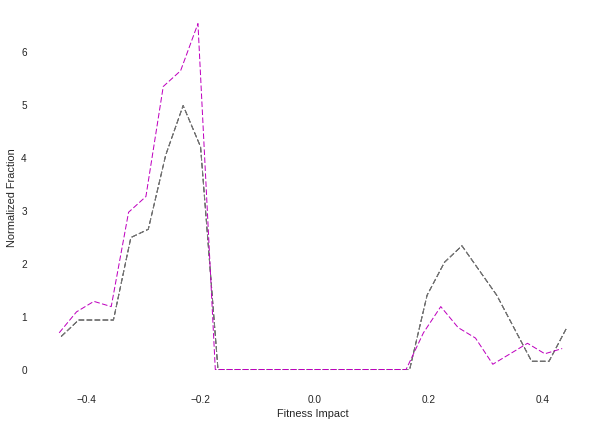

In [901]:
plot(mutList[minInd1], tempMutList[minInd2], mutList[maxInd])
plt.xlabel('Fitness Impact')
plt.ylabel('Normalized Fraction');

In [903]:
mutList

['0D',
 '0G',
 '0N',
 '0S',
 '10V',
 '1A',
 '1P',
 '2F',
 '2Y',
 '3A',
 '3C',
 '3S',
 '4F',
 '4V',
 '5I',
 '5T',
 '5V',
 '6D',
 '6E',
 '6K',
 '6N',
 '7C',
 '7S',
 '7T',
 '8I',
 '8V',
 '9P',
 '9T']

***

#### 4. Plotting a heatmap

In [7]:
globalWeights = {}

for i in range(len(combinations)):
    globalWeights[combinations[i]] = {}
    print ('\n', combinations[i], '\n')
    data, labels, classWeights, mutList, mutationDF = extractData(i)
    print ('\n')
    weights, _, _, _, _ = trainNN(data, labels, classWeights, 500)
    
    for j in range(len(weights)):
        globalWeights[combinations[i]][mutList[j]] = np.abs(weights[j][0])
    print ('\n-----------------')


 10FI 



/home/katya/anaconda3/envs/python2/lib/python2.7/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


224  Minor-mutations, 3235 Major-mutations
The fraction of Minor-mutations constitutes 6.48%

The class weights are: {0.0: 1.069242658423493, 1.0: 15.441964285714286}




/home/katya/anaconda3/envs/python2/lib/python2.7/site-packages/keras/backend/tensorflow_backend.py:2096: UserWarning: Expected no kwargs, you passed 1
kwargs passed to function are ignored with Tensorflow backend
  warnings.warn('\n'.join(msg))


The fraction of Minor-mutations in prediction constitutes 22.32%
204 Minor-mutations were predicted correctly
2667 Major-mutations were predicted correctly

The accuracy of this prediction is 0.81

-----------------

 10FL 

213  Minor-mutations, 838 Major-mutations
The fraction of Minor-mutations constitutes 20.27%

The class weights are: {0.0: 1.2541766109785202, 1.0: 4.934272300469484}


The fraction of Minor-mutations in prediction constitutes 56.14%
196 Minor-mutations were predicted correctly
444 Major-mutations were predicted correctly

The accuracy of this prediction is 0.62

-----------------

 0GN 

273  Minor-mutations, 1315 Major-mutations
The fraction of Minor-mutations constitutes 17.19%

The class weights are: {0.0: 1.2076045627376426, 1.0: 5.816849816849817}


The fraction of Minor-mutations in prediction constitutes 32.75%
262 Minor-mutations were predicted correctly
1057 Major-mutations were predicted correctly

The accuracy of this prediction is 0.83

---------------

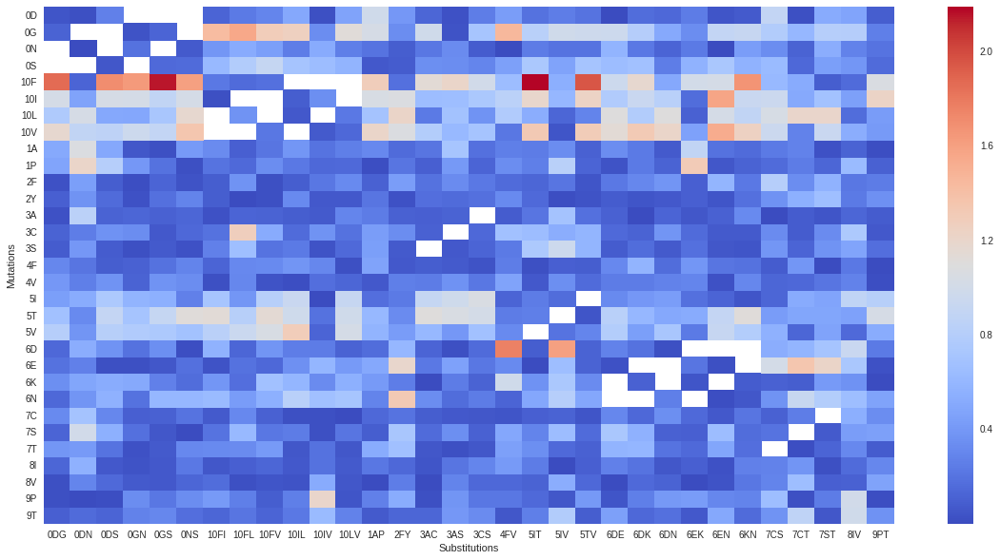

In [8]:
plt.figure(figsize=[20,10])
sns.heatmap(pd.DataFrame.from_dict(globalWeights), cmap='coolwarm')
plt.xlabel('Substitutions')
plt.ylabel('Mutations');

***

#### 5. Graph

In [115]:
weightsDF = pd.DataFrame.from_dict(globalWeights)
weightsDF.columns = [':'.join([i[:-1],i[:-2]+i[-1]]) for i in weightsDF.columns]

In [148]:
[i for i in weightsDF.columns if '10' not in i]

['0D:0G',
 '0D:0N',
 '0D:0S',
 '0G:0N',
 '0G:0S',
 '0N:0S',
 '1A:1P',
 '2F:2Y',
 '3A:3C',
 '3A:3S',
 '3C:3S',
 '4F:4V',
 '5I:5T',
 '5I:5V',
 '5T:5V',
 '6D:6E',
 '6D:6K',
 '6D:6N',
 '6E:6K',
 '6E:6N',
 '6K:6N',
 '7C:7S',
 '7C:7T',
 '7S:7T',
 '8I:8V',
 '9P:9T']

In [153]:
connections = []
thicknessDF = {}

nodes = [i for i in weightsDF.columns if '10' not in i]
nodes.extend([i for i in weightsDF.columns if '10' in i])

tempNodes = []

for i in weightsDF.index:
    if '10' not in i:
        if i not in tempNodes:
            tempNodes.append(i)
        
for i in weightsDF.index:
    if '10' in i:
        if i not in tempNodes:
            tempNodes.append(i)
        
for i in weightsDF.index:
    for j in weightsDF.columns:
        connections.append((i,j))
        thicknessDF[(i,j)] = weightsDF[j].ix[i]
        

nodes.extend(tempNodes)

In [155]:
H = nx.Graph()
H.size = {}
H.color = {}
H.width = {}

print ('Building the graph')
for i in nodes:
    if i in list(weightsDF.columns):
        H.add_node(i)
        H.size[i]=10000
        H.color[i]='#005691'
    else:
        H.add_node(i)
        H.size[i]=5000
        H.color[i]='red'   
    
for i in connections:
    H.add_edge(i[0], i[1], {'color':'black','thickness':thicknessDF[i]})

color=[attribs['color'] for (v_from,v_to,attribs) in H.edges(data=True)]
thickness=[attribs['thickness'] for (v_from,v_to,attribs) in H.edges(data=True)]

Building the graph


Plotting the graph


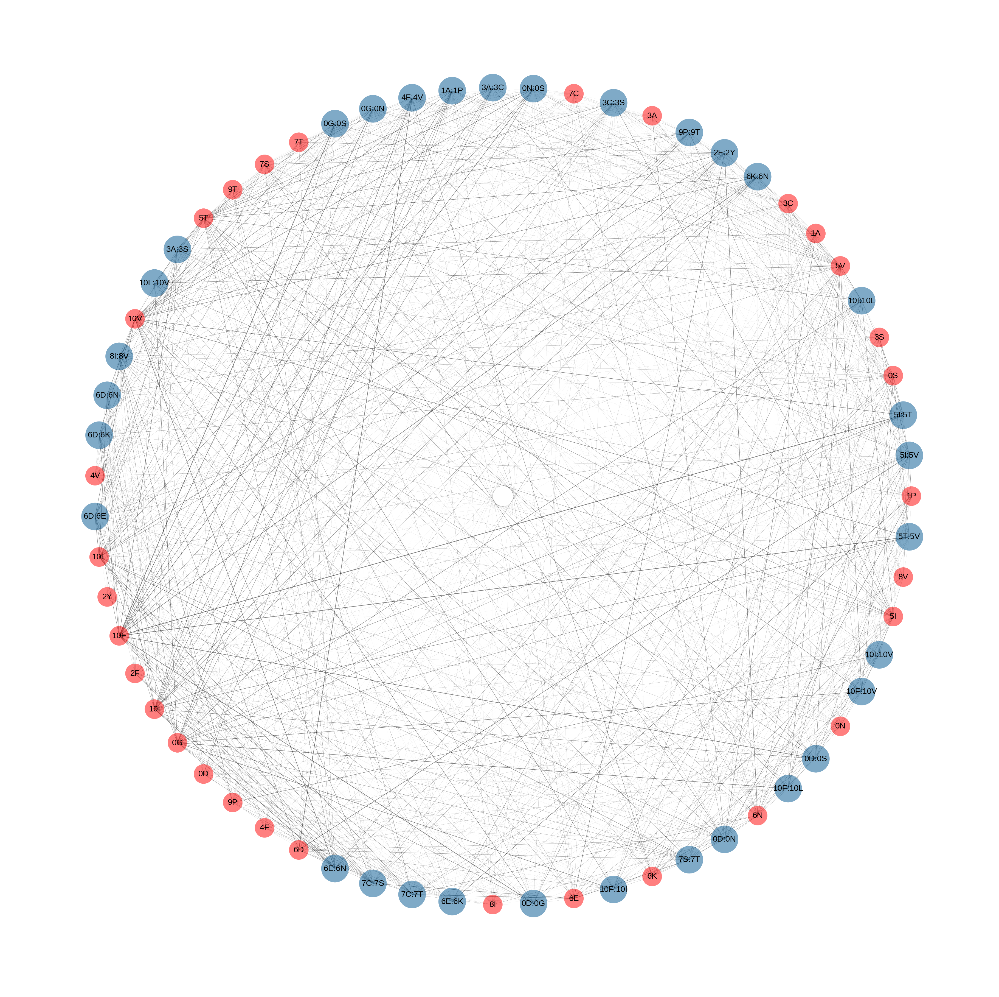

In [156]:
print ('Plotting the graph')
plt.figure(figsize=[50,50])
nx.draw_circular(H, with_labels=True,
                 node_size=[H.size[v] for v in H], alpha=0.5, node_color=[H.color[v] for v in H],
                 width=thickness, edge_color=color, font_size=30)

***

In [157]:
colorDict = {}
colors = ['#005691','#11999E','#2A2B5F','#FF4545',
          '#FF9867','#00AD7C','#FF0592','#415865',
         '#313131','#BE3144','black']

for i in range(11):
    colorDict[str(i)] = colors[i]

In [158]:
colorDict

{'0': '#005691',
 '1': '#11999E',
 '10': 'black',
 '2': '#2A2B5F',
 '3': '#FF4545',
 '4': '#FF9867',
 '5': '#00AD7C',
 '6': '#FF0592',
 '7': '#415865',
 '8': '#313131',
 '9': '#BE3144'}

In [159]:
jsonDict = {}
jsonDict['nodes'] = []
x = {}
y = {}

xLoc1 = 10
xLoc2 = 10

for node in nodes:
    if node in list(weightsDF.columns):
        
        x[node] = xLoc1
        y[node] = 0
        
        jsonDict['nodes'].append({'id':node, 'x':x[node], 'y': y[node], 'color':colorDict[node.split(':')[0][:-1]]})
        
        xLoc1 += (1400-10)/len(weightsDF.columns)
        
    else:
        x[node] = xLoc2
        y[node] = 200
        
        jsonDict['nodes'].append({'id':node, 'x':x[node], 'y': y[node],'color':colorDict[node[:-1]]})
        
        xLoc2 += (1400-10)/(len(nodes)-len(weightsDF.columns))
    
jsonDict['links'] = []

for link in connections:
    if np.isnan(thicknessDF[link]):
        jsonDict['links'].append({"source":link[0],"target":link[1],"value":0,
                                  "x1":x[link[0]],"x2":x[link[1]],
                                  "y1":y[link[0]],"y2":y[link[1]],'color':colorDict[link[0][:-1]]})
    else:
        jsonDict['links'].append({"source":link[0],"target":link[1],"value":thicknessDF[link],
                                  "x1":x[link[0]],"x2":x[link[1]],
                                  "y1":y[link[0]],"y2":y[link[1]],'color':colorDict[link[0][:-1]]})

In [160]:
with open('/home/katya/start/HIS3InterspeciesEpistasis/Analysis/Katya/NN/epistatic_interactions/interactions.json', 'w+') as outfile:  
    json.dump(jsonDict, outfile)

***